In [5]:
import advertools as adv
import pandas as pd
from ua_parser import user_agent_parser
import pyarrow.parquet as pq
import pyarrow
from ipywidgets import interact
import ua_parser
pd.options.display.max_columns = None

for p in [adv, pd, pyarrow]:
    print(f'{p.__name__:-<14}v{p.__version__}')

advertools----v0.13.5
pandas--------v1.5.3
pyarrow-------v9.0.0


In [8]:
%%time
adv.logs_to_df(
    log_file='/content/webserver logs.txt',
    output_file='output_file.parquet',
    errors_file='errors_file.txt',
    log_format='combined')

Parsed             311 lines.
CPU times: user 47.4 ms, sys: 11.5 ms, total: 58.9 ms
Wall time: 153 ms


In [9]:
logs_df = pd.read_parquet('output_file.parquet')
logs_df['datetime'] = pd.to_datetime(logs_df['datetime'],
                                     format='%d/%b/%Y:%H:%M:%S %z')

In [10]:
logs_df.head()

,client,userid,datetime,method,request,status,size,referer,user_agent
0,87.116.74.253,-,2022-02-28 14:04:44+02:00,POST,/wp-admin/admin-ajax.php,200,47.0,https://nargile.bg/wp-admin/admin.php?page=wc-...,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7...
1,91.196.124.220,-,2022-02-28 14:04:47+02:00,POST,/wp-cron.php?doing_wp_cron=1646049887.24761605...,200,NaN,https://nargile.bg/wp-cron.php?doing_wp_cron=1...,WordPress/5.9.1; https://nargile.bg
2,91.196.124.220,-,2022-02-28 14:06:45+02:00,POST,/wp-cron.php?doing_wp_cron=1646050005.39478302...,200,NaN,https://nargile.bg/wp-cron.php?doing_wp_cron=1...,WordPress/5.9.1; https://nargile.bg
3,87.116.74.253,-,2022-02-28 14:06:44+02:00,POST,/wp-admin/admin-ajax.php,200,47.0,https://nargile.bg/wp-admin/admin.php?page=wc-...,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7...
4,66.249.70.57,-,2022-02-28 14:06:46+02:00,GET,/category/alpaca-bowls/,200,262929.0,-,Mozilla/5.0 (compatible; Googlebot/2.1; +http:...


In [11]:
import adviz
import plotly.express as px
import matplotlib.pyplot as plt
import openpyxl

In [ ]:
!wget https://www.dropbox.com/scl/fi/uhg42ngml7tk5ev0hq7fp/logs_final.parquet?rlkey=ymg5p0jq5uc8fco3ogllv9d8p&dl=0

In [13]:
fpath = '/content/logs_final.parquet?rlkey=ymg5p0jq5uc8fco3ogllv9d8p'
column = ['client','datetime','method','request','status','size','referer','user_agent','hostname','request_url','request_path','referer_url','referer_path','ua_family','ua_major','ua_os.family','ua_device.family','ua_device.model']
df = pd.read_parquet(fpath, columns = column)

In [14]:
df.head()

,client,datetime,method,request,status,size,referer,user_agent,hostname,request_url,request_path,referer_url,referer_path,ua_family,ua_major,ua_os.family,ua_device.family,ua_device.model
0,87.116.74.253,2022-02-28 14:04:44+02:00,POST,/wp-admin/admin-ajax.php,200,47.0,https://nargile.bg/wp-admin/admin.php?page=wc-settings,"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/98.0.4758.109 Safari/5...",87-116-74-253.ip.btc-net.bg,/wp-admin/admin-ajax.php,/wp-admin/admin-ajax.php,https://nargile.bg/wp-admin/admin.php?page=wc-settings,/wp-admin/admin.php,Chrome,98,Mac OS X,Mac,Mac
1,91.196.124.220,2022-02-28 14:04:47+02:00,POST,/wp-cron.php?doing_wp_cron=1646049887.2476160526275634765625,200,NaN,https://nargile.bg/wp-cron.php?doing_wp_cron=1646049887.2476160526275634765625,WordPress/5.9.1; https://nargile.bg,ns77.superhosting.bg,/wp-cron.php?doing_wp_cron=1646049887.2476160526275634765625,/wp-cron.php,https://nargile.bg/wp-cron.php?doing_wp_cron=1646049887.2476160526275634765625,/wp-cron.php,WordPress,5,Other,Spider,Desktop
2,87.116.74.253,2022-02-28 14:06:44+02:00,POST,/wp-admin/admin-ajax.php,200,47.0,https://nargile.bg/wp-admin/admin.php?page=wc-settings,"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/98.0.4758.109 Safari/5...",87-116-74-253.ip.btc-net.bg,/wp-admin/admin-ajax.php,/wp-admin/admin-ajax.php,https://nargile.bg/wp-admin/admin.php?page=wc-settings,/wp-admin/admin.php,Chrome,98,Mac OS X,Mac,Mac
3,91.196.124.220,2022-02-28 14:06:45+02:00,POST,/wp-cron.php?doing_wp_cron=1646050005.3947830200195312500000,200,NaN,https://nargile.bg/wp-cron.php?doing_wp_cron=1646050005.3947830200195312500000,WordPress/5.9.1; https://nargile.bg,ns77.superhosting.bg,/wp-cron.php?doing_wp_cron=1646050005.3947830200195312500000,/wp-cron.php,https://nargile.bg/wp-cron.php?doing_wp_cron=1646050005.3947830200195312500000,/wp-cron.php,WordPress,5,Other,Spider,Desktop
4,66.249.70.57,2022-02-28 14:06:46+02:00,GET,/category/alpaca-bowls/,200,262929.0,-,Mozilla/5.0 (compatible; Googlebot/2.1; +http://www.google.com/bot.html),crawl-66-249-70-57.googlebot.com,/category/alpaca-bowls/,/category/alpaca-bowls/,-,-,Googlebot,2,Other,Spider,Desktop


# Top 10 hits hourly basis

In [15]:
df['hour'] = df['datetime'].dt.hour
top_10_hours = df['hour'].value_counts().head(10)
top_10_hours

16    199640
15    195853
17    180966
14    154217
21    153525
19    152252
20    151349
18    146061
22    140750
12    140118
Name: hour, dtype: int64

# Count total number of HTTP codes

In [16]:
http_code_counts = df['status'].value_counts()
print(http_code_counts)

200    2187390
304     157070
404      53468
301      14376
500       6824
406       2768
302       2020
405        561
401        542
503        178
206        163
403        136
400        117
201         12
303          9
421          2
502          1
Name: status, dtype: int64


# Status codes

In [17]:
fpath = '/content/logs_final.parquet?rlkey=ymg5p0jq5uc8fco3ogllv9d8p'
status = pd.read_parquet(fpath, columns=['status'])['status']
adviz.status_codes(status, theme='plotly_dark')

# Page/resource size distributions

In [ ]:
size_df = pd.read_parquet(fpath, columns=['size']).dropna()
px.histogram(size_df, x='size', title='Page size distribution (bytes) - all pages', template='plotly_dark')

In [19]:
px.histogram(
    size_df[size_df['size'].between(0, 100000)],
    x='size',
    title='Page size distribution (bytes)<br><b>page size < 100k</b>',
    nbins=10,
    template='plotly_dark')

In [20]:
px.histogram(
    size_df[size_df['size'].between(100000, 99999999999999)],
    x='size',
    title='Page size distribution (bytes)<br><b>page size > 100k</b>',
    nbins=10,
    template='plotly_dark')

# Status codes by method

In [21]:
method_status_counts = (pd.read_parquet(fpath,
                 columns=['method', 'status'])
 .value_counts()
 .reset_index()
 .rename(columns={0: 'count'})
 .sort_values(['method', 'count'], ascending=[True, False]))

In [22]:
adviz.style_table(
    method_status_counts,
    ['category', 'text', 'bar'],
    height=700,
    column_widths=[0.1, 0.1, 0.6],
    theme='plotly_dark',
    title='Status codes by method',
    font_size=16,
    width=800)

# Top User-agents/bots

In [23]:
top_bots = (pd.read_parquet(fpath,
                            filters=[
                                ('ua_device.family', '==', 'Spider')
                            ],
                            columns=['ua_family', 'size'])
            .groupby(['ua_family'])
            .agg({'size': ['count', 'sum']}))
top_bots.columns = ['requests', 'bytes']
top_bots['bytes per request'] = top_bots['bytes'] / top_bots['requests']
top_bots = top_bots.sort_values(['requests'], ascending=False).reset_index().head(20).rename(columns={'ua_family': 'bot'})
top_bots.head()

,bot,requests,bytes,bytes per request
0,bingbot,19786,3.269979e+09,165267.330739
1,Googlebot,17335,1.797332e+09,103682.252207
2,FacebookBot,7014,1.240195e+09,176817.131166
3,Screaming Frog SEO Spider,4533,8.186733e+08,180602.974630
4,AhrefsBot,2841,6.219142e+08,218906.808518


In [24]:
adviz.style_table(
    top_bots,
    column_types=['text', 'bar', 'heatmap', 'heatmap'],
    column_widths=[0.4, 0.2, 0.2, 0.2],
    title='Top bots',
    theme='plotly_dark',
    precision=0,
    height=700,
    width=800)

# Requests and total bytes by User-agent/bot

In [25]:
top_bots = (pd.read_parquet(fpath,
                            filters=[
                                ('ua_device.family', '==', 'Spider')
                            ],
                            columns=['ua_family', 'size'])
            .groupby(['ua_family'])
            .agg({'size': ['count', 'sum']}))
top_bots.columns = ['requests', 'bytes']
top_bots = top_bots.sort_values('requests', ascending=False)
top_bots['bytes per request'] = top_bots['bytes'] / top_bots['requests']


adviz.style_table(
    top_bots.head(15).reset_index().rename(columns={'ua_family': 'bot'}),
    ['text', 'bar', 'bar', 'bar'],
    column_widths=[0.4, .2, .2, .2],
    precision=0,
    height=700,
    title='Top bots – requests and bytes',
    title_font_size=30,
    theme='plotly_dark',
    font_size=12)

# Requests by bot (annual, monthly, weekly, daily, or hourly) – interactive
Please run this notebook to interactively select the period and bot name

In [26]:
bot_names = top_bots.sort_values('requests', ascending=False).head(20).index.tolist()
bot_names

periods = {
    'A': 'Annual',
    'M': 'Monthly',
    'W': 'Weekly',
    'D': 'Daily',
    'H': 'Hourly',
}

def bot_requests(botname='Googlebot', period='D'):
    df = (pd.read_parquet(fpath,
                            columns=['datetime', 'size'],
                            filters=[
                                ('ua_family', '=', botname)
                            ])
            .set_index('datetime')
            .resample(period).agg({'size': ['count', 'sum']}))
    df.columns = ['requests', 'total bytes']
    return (df.style
            .set_caption(f'<h3>Requests by {botname} - {periods[period]}</h3>')
            .format('{:,.0f}')
            .bar(color='lightgray'))
for i in range(3):
    print()
interact(bot_requests, botname=bot_names, period=periods.keys());


interactive(children=(Dropdown(description='botname', index=1, options=('bingbot', 'Googlebot', 'FacebookBot',…

# Status code by bot

In [27]:
ua_status_counts= (pd.read_parquet(fpath,
                                   columns=['ua_device.family', 'ua_family', 'status'],
                                   filters=[
                                       ('ua_device.family', '==', 'Spider'),
                                       ('ua_family', 'in', top_bots[:9].index)
                                   ])
                   .groupby(['ua_family','status'])['ua_device.family']
                   .count().reset_index()
                   .rename(columns={'ua_device.family': 'count'}))
ua_status_counts = ua_status_counts[ua_status_counts['count'].ne(0)].reset_index(drop=True)

ua_ranks = ua_status_counts.groupby('ua_family')['count'].sum().sort_values(ascending=False).reset_index().assign(rank=lambda df: range(1, len(df)+1))[['ua_family', 'rank']]

ua_status_counts = (pd.merge(ua_status_counts,
                             ua_ranks)
                    .sort_values(['rank', 'status'],
                                 ascending=[True, True])
                    [['ua_family', 'status', 'count']])
adviz.style_table(
    ua_status_counts.rename(columns={'ua_family': 'bot'}),
    ['category', 'text', 'bar'],
    column_widths=[.3, .1, .5],
    font_size=17,
    theme='plotly_dark',
    title='Status code counts by User-agent',
    precision=0,
    height=1100,
    width=900)

# Top pages/resources in bandwidth consumption

In [28]:
top_resources_bandwidth = (pd.read_parquet(fpath,
                 columns=['request', 'request_dir_1', 'request_last_dir', 'size'])
 .groupby('request')
 .agg({'size': ['count', 'mean', 'sum']})
 .sort_values(('size', 'sum'), ascending=False)
 .head(40)
).reset_index()
top_resources_bandwidth.columns = ['uri', 'requests', 'avg. size', 'total bytes']


adviz.style_table(
    top_resources_bandwidth,
    column_types=['text', 'heatmap', 'heatmap', 'bar'],
    column_widths=[.55, .1, .1, .25],
    title='Top pages/resources in bytes',
    title_font_size=30,
    precision=0,
    theme='plotly_dark',
    height=1100)

# Daily requests that resulted in 4xx or 5xx status codes

In [29]:
(pd.read_parquet(fpath,
                 columns=['datetime', 'status'])
 .assign(date=lambda df: df['datetime'].dt.date,
         status_400=lambda df: df['status'].isin(['400', '401', '403', '404', '405', '406']),
         status_500=lambda df: df['status'].isin(['500', '502', '503']))
 .groupby('date')
 .agg({'status_400': ['count', 'mean'],
       'status_500': ['count', 'mean']})
 .style
 .format({('status_500', 'mean'): '{:.2%}', ('status_500', 'count'): '{:,}',
         ('status_400', 'mean'): '{:.2%}', ('status_400', 'count'): '{:,}'})
 .bar(color='lightblue')
 .set_caption('<h3>Daily requests with status code 4XX and 5XX')
)

# Total hits per URL and find the URL with maximum hits

In [30]:
url_hit_counts = df['request'].value_counts()
print(url_hit_counts)

/wp-admin/admin-ajax.php                                             52292
/wp-content/uploads/2021/05/HLGN-Logo.png                            31492
/                                                                    22741
/?wc-ajax=get_refreshed_fragments                                    22431
/?nitroWebhook=cache_ready&token=fdccd0f43d6699b0ad7852228297d999    20737
                                                                     ...  
/wp-content/plugins/embedplus-for-wordpress                              1
/wp-content/plugins/dmsguestbook                                         1
/wp-content/plugins/content-slide                                        1
/wp-content/plugins/twitter-tools                                        1
/wp-cron.php?doing_wp_cron=1648728546.4634799957275390625000             1
Name: request, Length: 119288, dtype: int64


In [31]:
max_hits_url = url_hit_counts.idxmax()
print(f'URL with maximum hits is :{max_hits_url}')

URL with maximum hits is :/wp-admin/admin-ajax.php


# Total hits per platform (Android, iOS)

In [32]:
platform_hit_counts = df.groupby('ua_os.family')['client'].count()
print(platform_hit_counts)

ua_os.family
Android          756726
BlackBerry OS         1
Chrome OS          1584
Fedora              484
Linux              2459
Mac OS X         214314
Other            104502
Tizen               184
Ubuntu             2468
Windows          440540
iOS              902375
Name: client, dtype: int64


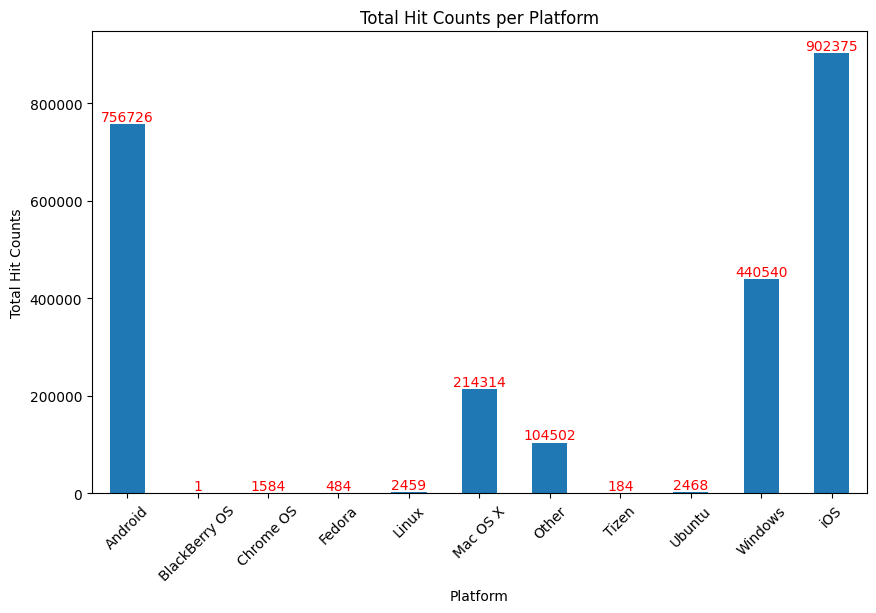

In [33]:
# Create a bar plot
plt.figure(figsize=(10, 6))
ax = platform_hit_counts.plot(kind='bar')
plt.title('Total Hit Counts per Platform')
plt.xlabel('Platform')
plt.ylabel('Total Hit Counts')
plt.xticks(rotation=45)

# Add count labels above each bar
for i, v in enumerate(platform_hit_counts):
    ax.text(i, v, str(v), ha='center', va='bottom', fontsize=10 , color = 'red')

plt.show()

# Total hits per browser

In [34]:
browser_hit_counts = df.groupby('ua_family')['client'].count()
print(browser_hit_counts)

ua_family
AOL                    1
AdsBot-Google          8
AhrefsBot           2933
Android              366
AppEngine-Google       5
                    ... 
ev-crawler             4
faviconkit             1
spider                 2
t3versionsBot          1
webprosbot            20
Name: client, Length: 101, dtype: int64
